In [1]:
import matplotlib.pyplot as plt
import cv2
import numpy as np
from glob import glob
from skimage.feature import hog
import os
from skimage import exposure
from skimage import segmentation
from sklearn.cluster import KMeans

In [2]:
def funcionLeerClase(pathDirectorio):
    pathsCompletos = glob(pathDirectorio+'/*')
    imagenes = []
    nombresMonedas = []
    for nombreImagen in pathsCompletos:
        imagen = cv2.imread(nombreImagen)
        imagenes.append(imagen)
        nombresMonedas.append(nombreImagen)
    return imagenes,nombresMonedas

In [3]:
def funcionLeerTodasClases(pathDirectorio):
    etiquetasClases = ['1c','2c','5c','10c','20c','50c','1e', '2e']
    lista1c = []
    lista2c = []
    lista5c = []
    lista10c = []
    lista20c = []
    lista50c = []
    lista1e = []
    lista2e = []
    vec_listas = [lista1c,lista2c,lista5c,lista10c,lista20c,lista50c,lista1e,lista2e]
    nombresMonedas = []
    for i in range(len(etiquetasClases)):
        print('En',pathDirectorio+'/'+etiquetasClases[i], end = "")
        vec_listas[i], aux = funcionLeerClase(pathDirectorio+'/'+etiquetasClases[i])
        nombresMonedas = nombresMonedas + aux
        print(', hay', len(vec_listas[i]), 'ejemplos')
    return vec_listas,nombresMonedas

In [4]:
imagenes, nombresMonedas = funcionLeerTodasClases('train')

En train/1c, hay 77 ejemplos
En train/2c, hay 25 ejemplos
En train/5c, hay 284 ejemplos
En train/10c, hay 254 ejemplos
En train/20c, hay 227 ejemplos
En train/50c, hay 131 ejemplos
En train/1e, hay 248 ejemplos
En train/2e, hay 45 ejemplos


In [5]:
def ecualizacionAdaptativa(image):
    lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
    lab_planes = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=2.0,tileGridSize=(3,3))
    lab_planes[0] = clahe.apply(lab_planes[0])
    lab = cv2.merge(lab_planes)
    ecualizada = cv2.cvtColor(lab, cv2.COLOR_LAB2BGR).astype('uint8')
    return ecualizada

In [6]:
def imagen_media_color(imagen, nClusters):
    alg = KMeans(n_clusters=nClusters, n_init = 20)
    alg.fit(np.hstack((img[:,:,0].reshape(-1,1), img[:,:,1].reshape(-1,1), img[:,:,2].reshape(-1,1))))
    etiquetas = alg.labels_
    centros = alg.cluster_centers_
    nuevaImagen = np.zeros(imagen.shape)
    nuevaImagen = centros[etiquetas].reshape(imagen.shape)
    return nuevaImagen/255

In [7]:
def quitarFondo(img):
    imgBlurreada = cv2.blur(img,(7,7))
    imagenMedia = imagen_media_color(imgBlurreada, nClusters = 2)
    puntoCentro = (img.shape[0]//2,img.shape[1]//2)
    imagenSinFondo = img.copy()
    posFondo = (imagenMedia != imagenMedia[puntoCentro])
    #Intenté ponerle de color el fondo de la moneda, pero no pude
    '''
    imagenSinFondo[posFondo[:,:,0]] = imagenMedia[:,:,0][puntoCentro]
    imagenSinFondo[posFondo[:,:,1]] = imagenMedia[:,:,1][puntoCentro]
    imagenSinFondo[posFondo[:,:,2]] = imagenMedia[:,:,2][puntoCentro]
    '''
    imagenSinFondo[posFondo] = 255
    return imagenSinFondo

In [8]:
def realceBordes(imagen, a, tamKernel):    
    imagenConMedia = cv2.blur(imagen,(tamKernel,tamKernel))
    imageBordes = imagen - imagenConMedia
    imagenFinal = (imagen + a * imageBordes).astype(np.uint8)
    return imagenFinal

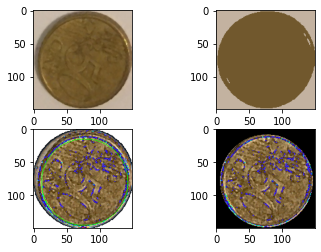

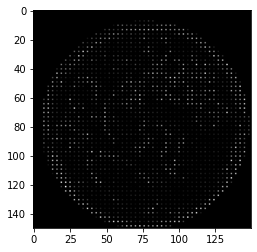

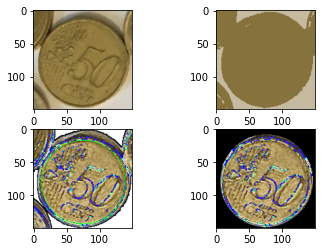

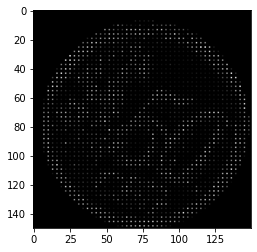

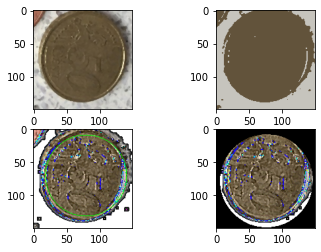

...

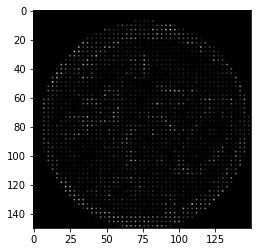

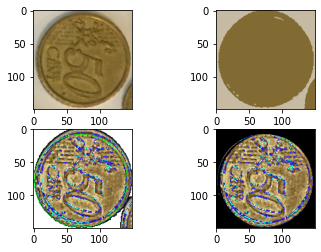

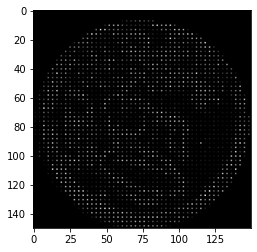

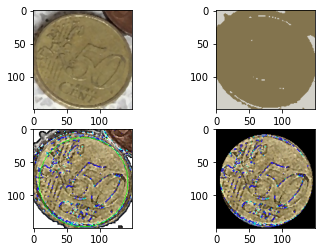

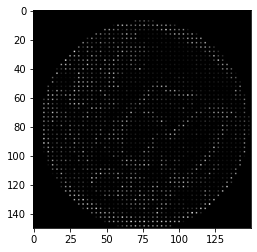

In [19]:
Xtrain = np.zeros((len(nombresMonedas),758912))
Ytrain = np.zeros(len(nombresMonedas))

for i,img in enumerate(imagenes[5]):
    img = cv2.medianBlur(img,3)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    imagenMedia = imagen_media_color(img, 2)
    
    plt.subplot(221), plt.imshow(img)
    plt.subplot(222), plt.imshow(imagenMedia)
    
    imagenSinFondo = quitarFondo(img)
    imagenSinFondo = ecualizacionAdaptativa(imagenSinFondo)
#     plt.subplot(223), plt.imshow(imagenSinFondo)
    
    imagenSinFondo = realceBordes(imagenSinFondo, a = 2, tamKernel = 5)
#     plt.subplot(224), plt.imshow(imagenSinFondo)
    
    
    ###############################################################
    # BUSCAMOS LA SILUETA DE LA MONEDA PRINCIPAL EN LA IMAGEN
    ###############################################################
    output = imagenSinFondo.copy()
    gray = cv2.cvtColor(output, cv2.COLOR_RGB2GRAY)

    circles = cv2.HoughCircles(gray,cv2.HOUGH_GRADIENT,dp=1,minDist=150,param1=40,param2=60,minRadius=30,maxRadius=90)

    if circles is not None:
        circles = np.round(circles[0, :]).astype("int")
        for (x, y, r) in circles:
            cv2.circle(output, (x, y), r, (0, 255, 0), 1)

    plt.subplot(223), plt.imshow(output)

    ###############################################################
    # Creamos mascara de la moneda
    ###############################################################
    grayOutput = cv2.cvtColor(output, cv2.COLOR_RGB2GRAY)
    siluetaMoneda = gray-grayOutput
    siluetaMoneda[siluetaMoneda>0] = 255
    mascaraMoneda = np.copy(siluetaMoneda)
    cnts = cv2.findContours(mascaraMoneda, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
    cnts = cnts[0] if len(cnts) == 2 else cnts[1]

    cv2.drawContours(mascaraMoneda,[c], 0, (255,255,255), -1)

    ###############################################################
    # Creamos una imagen con la moneda y el fondo negro
    ###############################################################
    monedaSinFondo = np.copy(imagenSinFondo)
    monedaSinFondo[mascaraMoneda==0] = 0
    plt.subplot(224), plt.imshow(monedaSinFondo)

    #################################################################
    
    fd, hog_image = hog(monedaSinFondo, orientations=8, pixels_per_cell=(8, 8),cells_per_block=(7, 7), visualize=True)
    hog_image_rescaled = exposure.rescale_intensity(hog_image, in_range=(0, 255))
    
    Xtrain[i] = fd
    plt.show()
    plt.figure(), plt.imshow(hog_image_rescaled, cmap = 'gray')
    plt.show()
    

In [11]:
for i,nombre in enumerate(nombresMonedas):
    if ('1c' in nombre):
        Ytrain[i] = 1
    if ('2c' in nombre):
        Ytrain[i] = 4
    if ('5c' in nombre):
        Ytrain[i] = 7
    if ('10c' in nombre):
        Ytrain[i] = 0
    if ('20c' in nombre):
        Ytrain[i] = 3
    if ('50c' in nombre):
        Ytrain[i] = 6
    if ('1e' in nombre):
        Ytrain[i] = 2
    if ('2e' in nombre):
        Ytrain[i] = 5